In [91]:
#create cost model
#load trainisni data into cost model
#give cost model n true transfers
# evaluate all other knonw transfers through cost model
# plot true throughouts vs estimated throughputs


In [1]:
import sys
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
project_root = os.path.abspath(os.path.join(os.getcwd(), '../../../'))
sys.path.insert(0, project_root)
plt.rcParams['figure.dpi'] = 600
from experiments.model_optimizer.model_implementations.Weighted_Combination_RF_Cost_Model import Per_Environment_RF_Cost_Model
from experiments.model_optimizer.Configs import *
from experiments.model_optimizer.environments import *
from experiments.model_optimizer.main_experiments import get_transfer_learning_data_for_environment
from experiments.model_optimizer.cost_model_config_finder import get_next_suggestion


sagemaker.config INFO - Not applying SDK defaults from location: C:\ProgramData\sagemaker\sagemaker\config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: C:\Users\bened\AppData\Local\sagemaker\sagemaker\config.yaml
Dependencies of YAHPO are not imported since dependencies are missing. You can install them with
   pip install 'syne-tune[yahpo]'
or (for everything)
   pip install 'syne-tune[extra]'
Cannot import h5py. Use 'pip install h5py'
Dependencies of YAHPO are not imported since dependencies are missing. You can install them with
   pip install 'syne-tune[yahpo]'
or (for everything)
   pip install 'syne-tune[extra]'


In [10]:
# create the cost model
search_space = config_space_variable_parameters_generalized_FOR_NEW_ITERATION_FLEXIBLE_EX_BufSiz
mode = 'max'
metric = 'uncompressed_throughput'
input_fields = [
        "client_bufpool_factor",
        "server_bufpool_factor",
        "buffer_size",
        "compression",
        "send_par",
        "write_par",
        "decomp_par",
        "read_par",
        "deser_par",
        "ser_par",
        "comp_par"
    ]

environment = env_S8_C16_N150

cost_model = Per_Environment_RF_Cost_Model(input_fields=input_fields,
                                               metric=metric,
                                               data_per_env=900,
                                               underlying="test_cost_model",
                                               cluster=True,
                                               regression_model='xgb',
                                               network_transformation=False,
                                               history_ratio=1
                                               )

#train the cost model
data, suffix = get_transfer_learning_data_for_environment(environment, False)

x = data
y = data[metric]

cost_model.train(x, y)

# give the cost model n updates:

N = 15

signature = environment_to_string(environment)

base_path = "C:/Users/bened/Desktop/Uni/repos/xdbc-client/experiments/model_optimizer/random_samples_10_5M_semi_flex"
random_sample_file = f"{base_path}/{signature}_random_samples.csv"

df = pd.read_csv(random_sample_file)
df = df[df['transfer_id'] > 0]

rows_to_update_on = df.sample(n=N,random_state=123)

for index, row in rows_to_update_on.iterrows():
    row_dict = row.to_dict()
    cost_model.update(config=row_dict,result={metric:row[metric]})

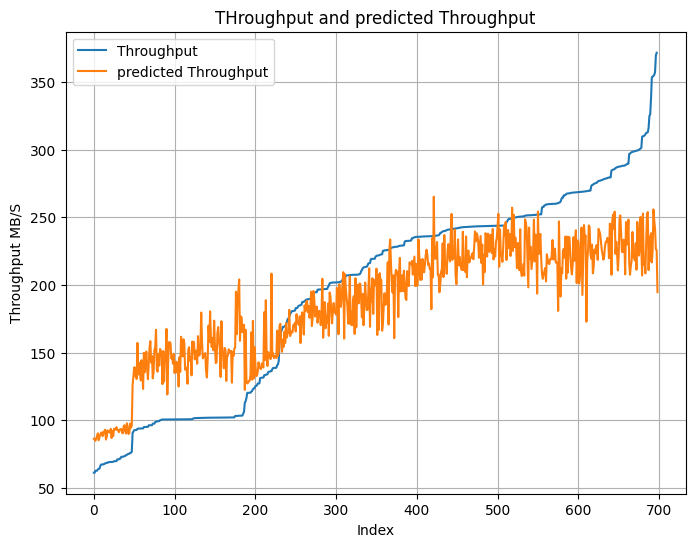

In [11]:
predictions = []
for index, row in df.iterrows():
    row_dict = row.to_dict()
    prediction = cost_model.predict(data=row_dict, target_environment=environment)
    predictions.append(prediction[metric])

df['prediction'] = predictions

# Sort the DataFrame by the 'metric' column
df_sorted = df.sort_values(by=metric, ascending=True).reset_index(drop=True)

# Create a line plot of 'metric' and 'prediction'
plt.figure(figsize=(8, 6))
plt.plot(df_sorted.index, df_sorted[metric], label='Throughput')
plt.plot(df_sorted.index, df_sorted['prediction'], label='predicted Throughput')
plt.xlabel('Index')
plt.ylabel('Throughput MB/S')
plt.title('THroughput and predicted Throughput')
plt.legend()
plt.grid(True)
plt.show()

In [22]:
def get_plot_for_environment(environment,N=10,regression_model='xgb'):
    # create the cost model
    search_space = config_space_variable_parameters_generalized_FOR_NEW_ITERATION_FLEXIBLE_EX_BufSiz    
    mode = 'max'    
    metric = 'uncompressed_throughput'
    input_fields = [
            "client_bufpool_factor",
            "server_bufpool_factor",
            "buffer_size",
            "compression",
            "send_par",
            "write_par",
            "decomp_par",
            "read_par",
            "deser_par",
            "ser_par",
            "comp_par"
        ]   
    
    cost_model = Per_Environment_RF_Cost_Model(input_fields=input_fields,
                                                   metric=metric,
                                                   data_per_env=900,
                                                   underlying="test_cost_model",
                                                   cluster=True,
                                                   regression_model=regression_model,
                                                   network_transformation=False,
                                                   history_ratio=1
                                                   )
    
    #train the cost model
    data, suffix = get_transfer_learning_data_for_environment(environment, False)
    
    x = data
    y = data[metric]
    
    cost_model.train(x, y)
    
    # give the cost model n updates:
    
    #N = 10
    
    signature = environment_to_string(environment)
    
    base_path = "C:/Users/bened/Desktop/Uni/repos/xdbc-client/experiments/model_optimizer/random_samples_10_5M_semi_flex"
    random_sample_file = f"{base_path}/{signature}_random_samples.csv"
    #print(random_sample_file)
    
    df = pd.read_csv(random_sample_file)
    df = df[df['transfer_id'] > 0]
    df = df.dropna()

    max_throughput = df[metric].max()

    df_high = df[df[metric] > max_throughput*0.7]
    
    #rows_to_update_on = df.sample(n=N,random_state=123)
    rows_to_update_on = df_high.sample(n=min(N,len(df_high)),random_state=123)

    
    for index, row in rows_to_update_on.iterrows():
        row_dict = row.to_dict()
        cost_model.update(config=row_dict,result={metric:row[metric]})


    predictions = []
    for index, row in df.iterrows():
        row_dict = row.to_dict()
        prediction = cost_model.predict(data=row_dict, target_environment=environment)
        predictions.append(prediction[metric])
    
    df['prediction'] = predictions
    
    # Sort the DataFrame by the 'metric' column
    df_sorted = df.sort_values(by=metric, ascending=True).reset_index(drop=True)

    df_sorted['rolling_avg'] = df_sorted['prediction'].rolling(window=15).mean()
    
    # Create a line plot of 'metric' and 'prediction'
    plt.figure(figsize=(12, 6))
    plt.plot(df_sorted.index, df_sorted[metric], label='Throughput')
    plt.plot(df_sorted.index, df_sorted['prediction'], label='predicted Throughput')
    
    plt.plot(df_sorted.index, df_sorted['rolling_avg'], label='Rolling Average (window=15)')
    
    plt.xlabel('predicted Throughput')
    plt.ylabel('Throughput MB/S')
    plt.title(f'Throughput and predicted Throughput for {signature} after {N} updates   {regression_model}')
    plt.legend()
    #plt.ylim(0,700)
    plt.grid(True)
    plt.show()

C:/Users/bened/Desktop/Uni/repos/xdbc-client/experiments/model_optimizer/random_samples_10_5M_semi_flex/S2_C2_N50_random_samples.csv


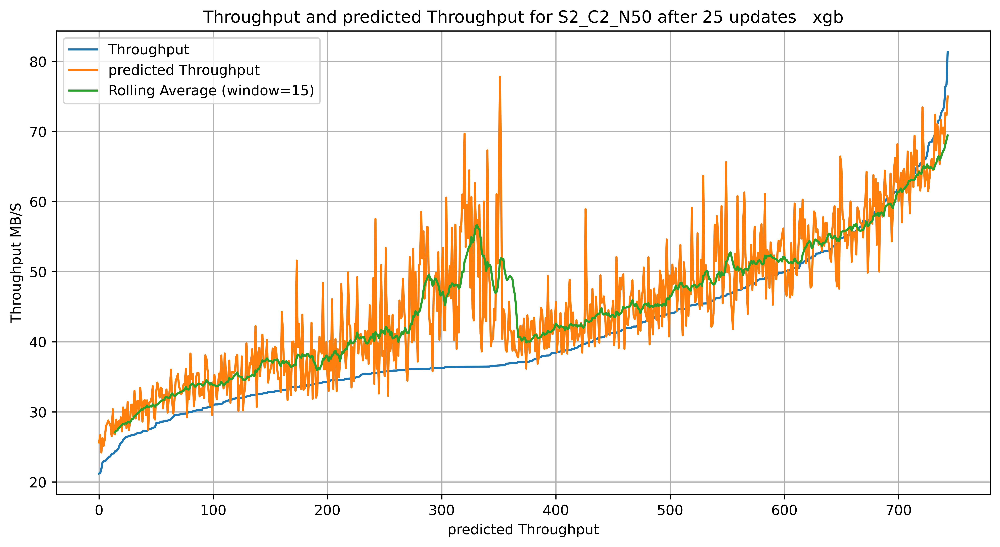

C:/Users/bened/Desktop/Uni/repos/xdbc-client/experiments/model_optimizer/random_samples_10_5M_semi_flex/S2_C8_N50_random_samples.csv


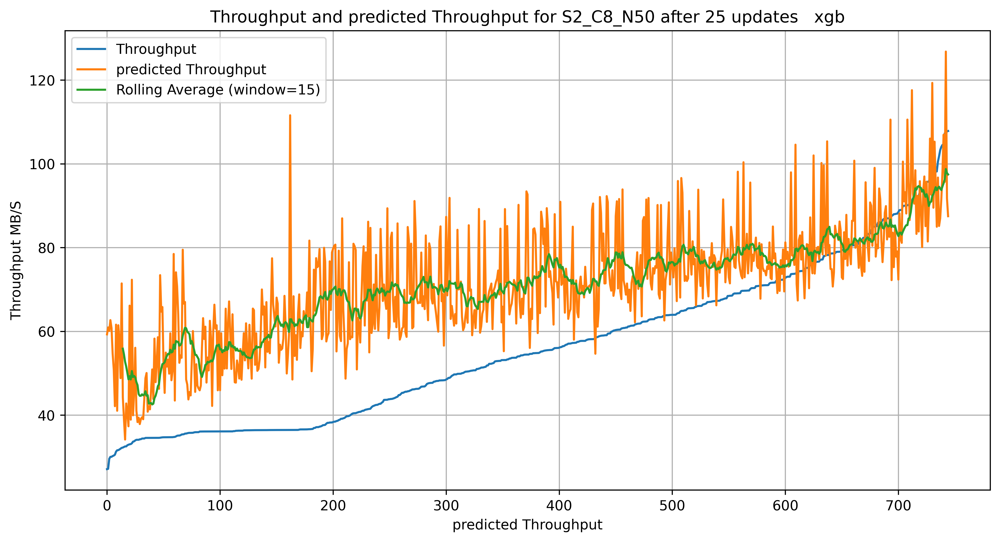

C:/Users/bened/Desktop/Uni/repos/xdbc-client/experiments/model_optimizer/random_samples_10_5M_semi_flex/S4_C16_N50_random_samples.csv


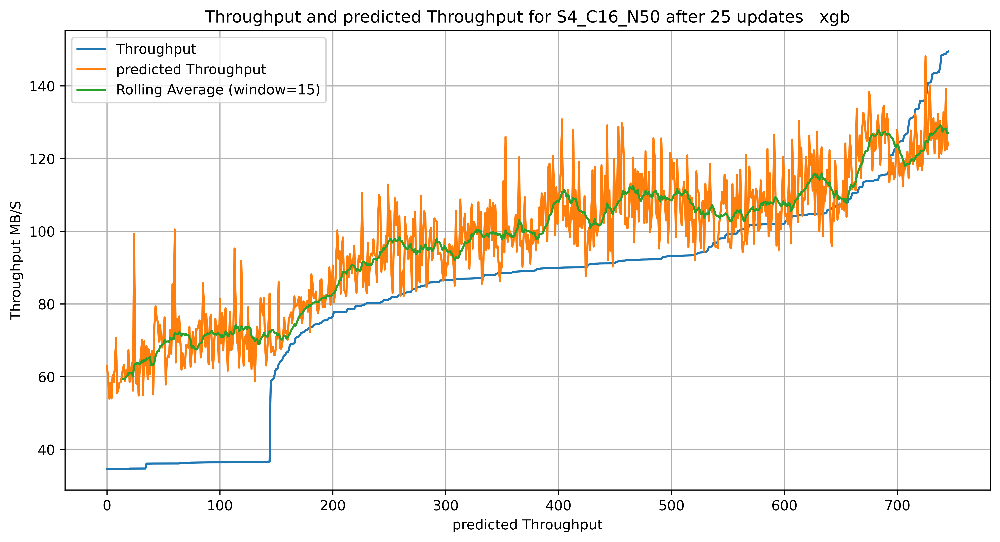

C:/Users/bened/Desktop/Uni/repos/xdbc-client/experiments/model_optimizer/random_samples_10_5M_semi_flex/S8_C8_N150_random_samples.csv


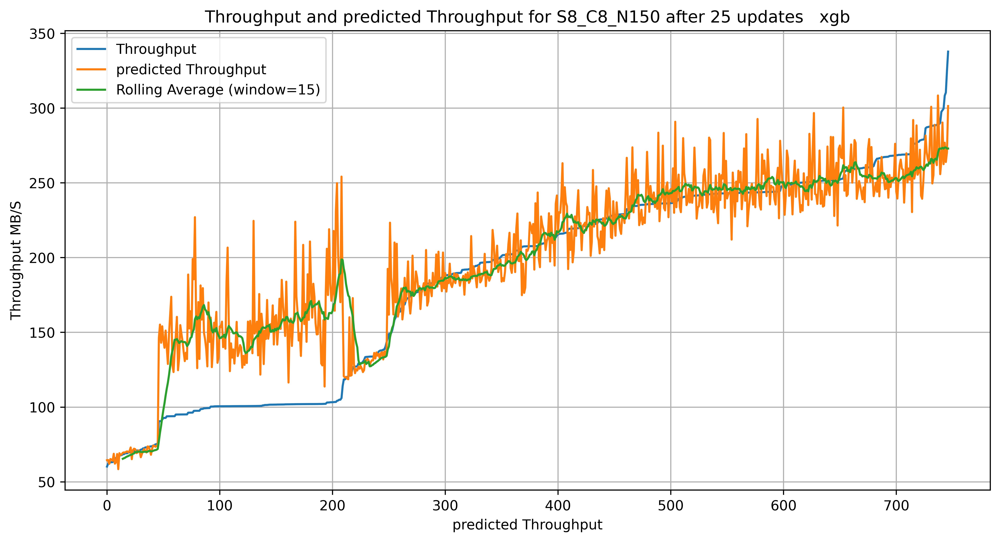

C:/Users/bened/Desktop/Uni/repos/xdbc-client/experiments/model_optimizer/random_samples_10_5M_semi_flex/S8_C2_N150_random_samples.csv


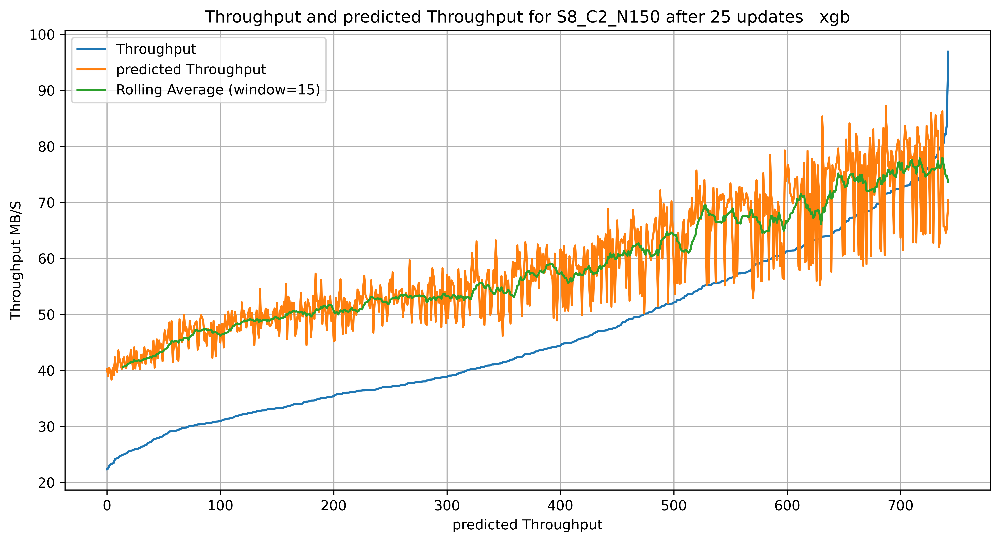

C:/Users/bened/Desktop/Uni/repos/xdbc-client/experiments/model_optimizer/random_samples_10_5M_semi_flex/S8_C16_N150_random_samples.csv


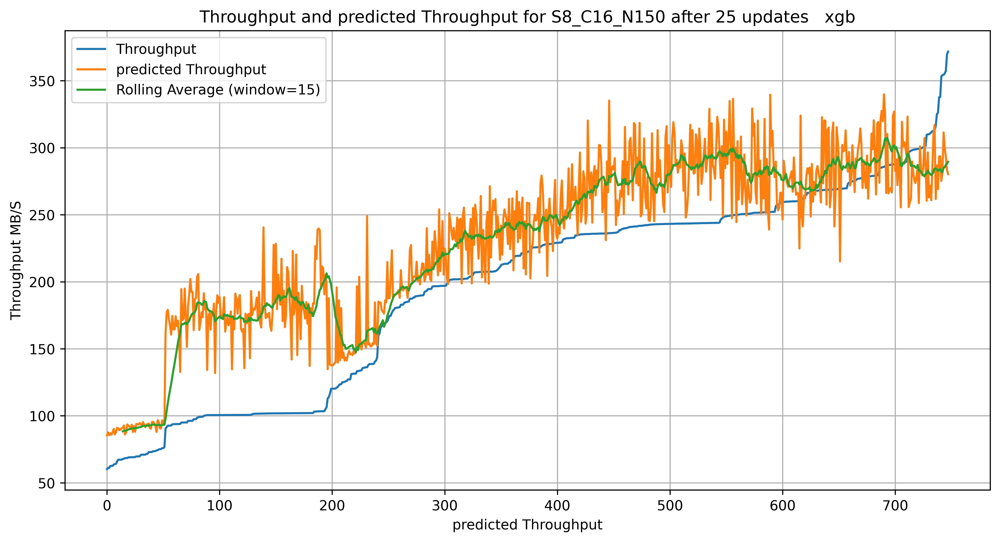

C:/Users/bened/Desktop/Uni/repos/xdbc-client/experiments/model_optimizer/random_samples_10_5M_semi_flex/S16_C4_N1000_random_samples.csv


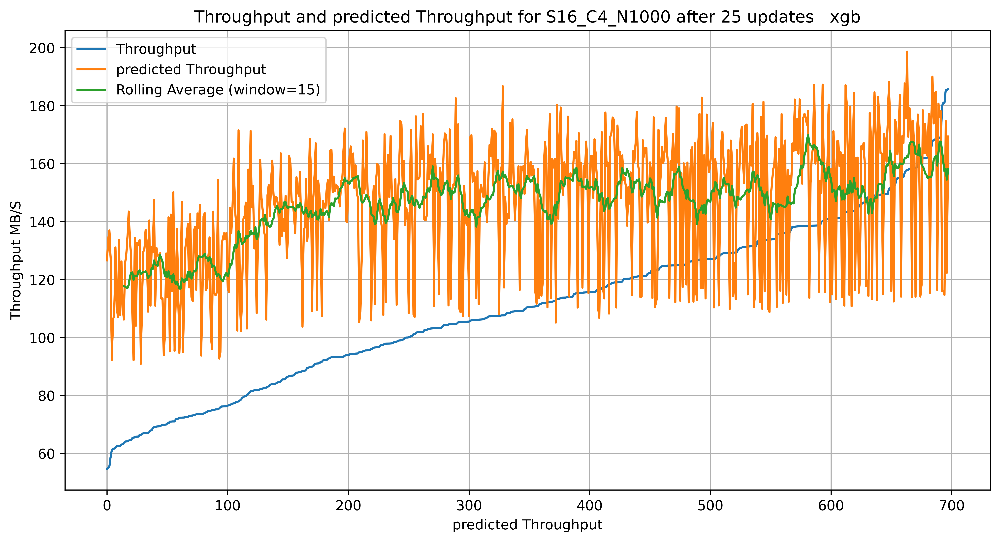

C:/Users/bened/Desktop/Uni/repos/xdbc-client/experiments/model_optimizer/random_samples_10_5M_semi_flex/S16_C8_N1000_random_samples.csv


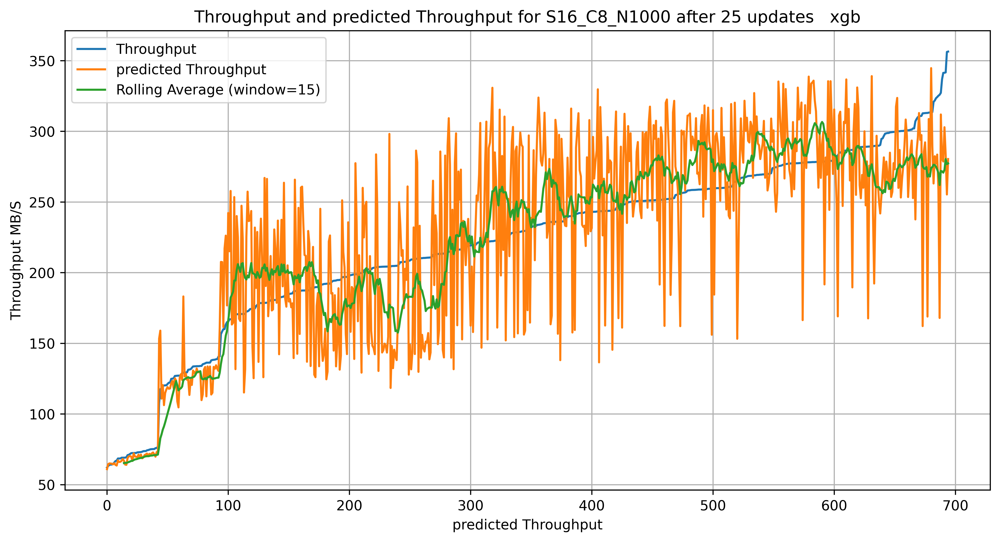

C:/Users/bened/Desktop/Uni/repos/xdbc-client/experiments/model_optimizer/random_samples_10_5M_semi_flex/S16_C16_N1000_random_samples.csv


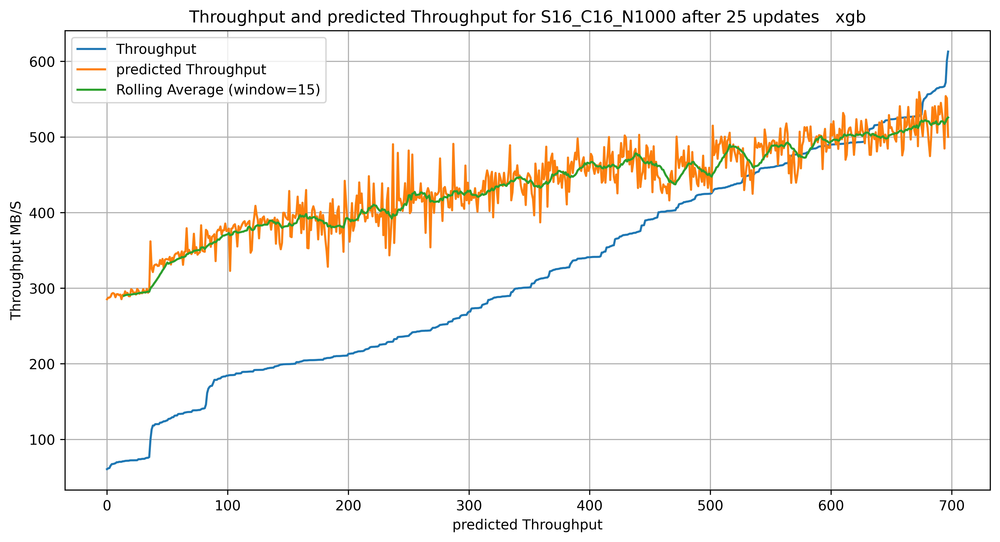

In [20]:
for env in environment_list_main_envs:
    #get_plot_for_environment(env,1,'xgb')
    #get_plot_for_environment(env,5,'xgb')
    #get_plot_for_environment(env,10,'xgb')
    get_plot_for_environment(env,25,'xgb')

In [ ]:
env = env_S16_C4_N150
get_plot_for_environment(env,0,'xgb')
get_plot_for_environment(env,1,'xgb')
get_plot_for_environment(env,5,'xgb')
get_plot_for_environment(env,10,'xgb')
get_plot_for_environment(env,20,'xgb')
get_plot_for_environment(env,40,'xgb')
